In [175]:
import numpy as np
import os,cmath
import skimage
import matplotlib
import matplotlib.pyplot as plt
from numpy.fft import fft,fft2,ifft,ifft2,fftshift,ifftshift
from math import sqrt,exp,pi,cos,sin
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
import cv2
from time import time
from matplotlib.image import imread
from scipy.ndimage.interpolation import rotate
from scipy.signal import convolve2d
import scipy.interpolate as si
from PIL import Image
import PIL
# plt.rcParams["figure.figsize"] = (15,15)
# plt.rcParams["figure.dpi"] = 40
%matplotlib inline

In [176]:
# Input data
file = os.path.join(os.getcwd(), 'Synthetic Images/img3.png')
zoneplate = imread(file)
file = os.path.join(os.getcwd(), 'Image data/Face/im01.jpg')
paul = imread(file)

factorx = 2.5
factory = 2.5
cf = 60

In [177]:
def gausslow2D(x,cf):
    '''
    X = freq domain transform of input signal
    cf = cutoff frequecy
    '''
    X = fftshift(fft2(x))
    if (len(X.shape)%2 > 0):
        raise ValueError('Ensure that frequency transform is two dimensional only')
    else:
        m,n = X.shape
        D = (np.zeros(X.shape,dtype = np.float64))
        output = (np.zeros(X.shape, dtype = np.float64))
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
                D[i,j] = sqrt((i-m/2)**2+(j-n/2)**2)
                output[i,j] = exp(-1*D[i,j]**2/(2*(cf**2)))
        filtout = ifft2(ifftshift(np.multiply(X,output)))
        return filtout

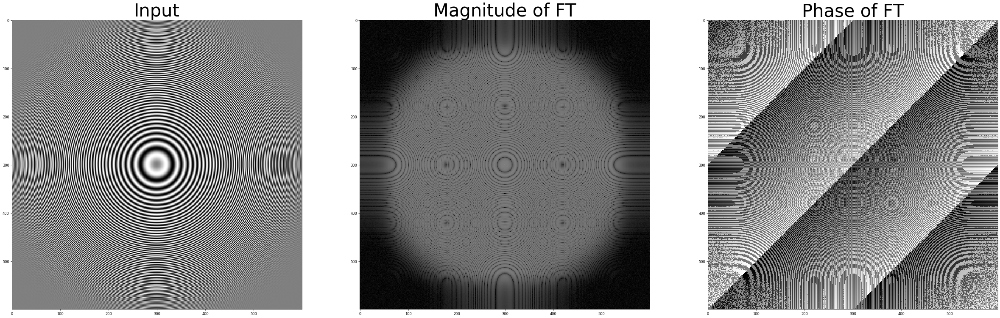

In [178]:
zoneplate = np.array(zoneplate)
h = zoneplate.shape[0]
w = zoneplate.shape[1]
zone_fft = fftshift(fft2(zoneplate))
zone_fft = zone_fft.astype(np.complex_)
fig = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig.add_subplot(131)
ax1.imshow(zoneplate, interpolation = None, cmap = cm.gray)
ax2 = fig.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(zone_fft)), cmap = cm.gray)
ax3 = fig.add_subplot(133)
ax3.imshow(np.angle(zone_fft), interpolation =None, cmap = cm.gray)
ax1.set_title('Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()

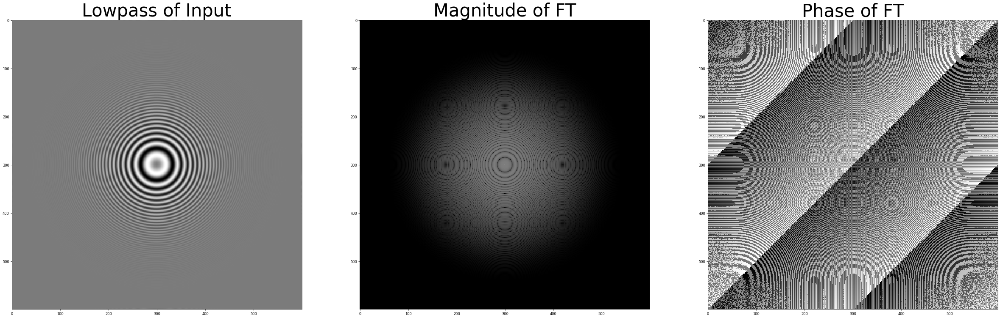

In [179]:
zone_gauss = gausslow2D(zoneplate, cf)
zone_gauss_fft = fftshift(fft2(zone_gauss))
fig = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig.add_subplot(131)
ax1.imshow(np.real(zone_gauss), interpolation =None, cmap = cm.gray)
ax2 = fig.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(zone_gauss_fft)), cmap = cm.gray)
ax3 = fig.add_subplot(133)
ax3.imshow(np.angle(zone_gauss_fft), interpolation =None, cmap = cm.gray)
ax1.set_title('Lowpass of Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()

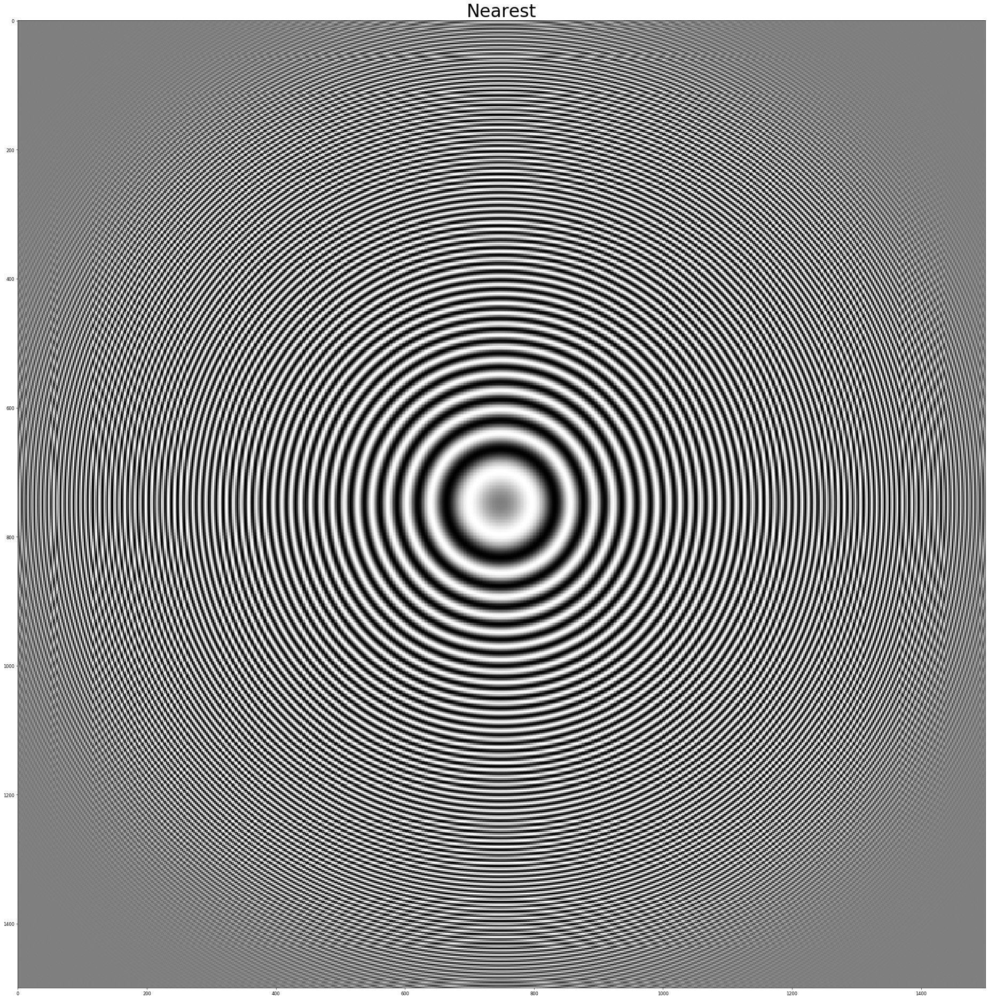

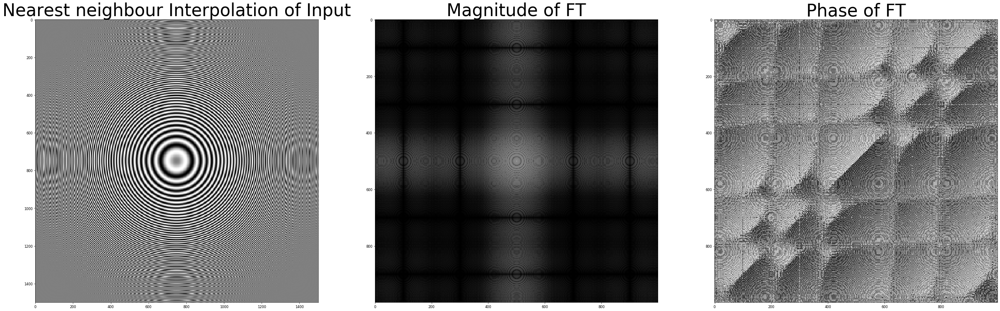

In [180]:
zoneplate = Image.fromarray(zoneplate)
resized_zpl = np.array(zoneplate.resize([int(np.ceil(h*factorx)),int(np.ceil(w*factory))], resample = PIL.Image.NEAREST))
res_fft_near = fftshift(fft2(resized_zpl))
fig1 = plt.figure(figsize = [40,40], dpi = 60)
axf1 = fig1.add_subplot(111)
axf1.imshow(np.real(resized_zpl), interpolation = None, cmap = cm.gray)
axf1.set_title('Nearest',fontsize = 40)
fig2 = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig2.add_subplot(131)
ax1.imshow(np.real(resized_zpl), interpolation =None, cmap = cm.gray)
ax2 = fig2.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(res_fft)), cmap = cm.gray)
ax3 = fig2.add_subplot(133)
ax3.imshow(np.angle(res_fft), interpolation =None, cmap = cm.gray)
ax1.set_title('Nearest neighbour Interpolation of Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()

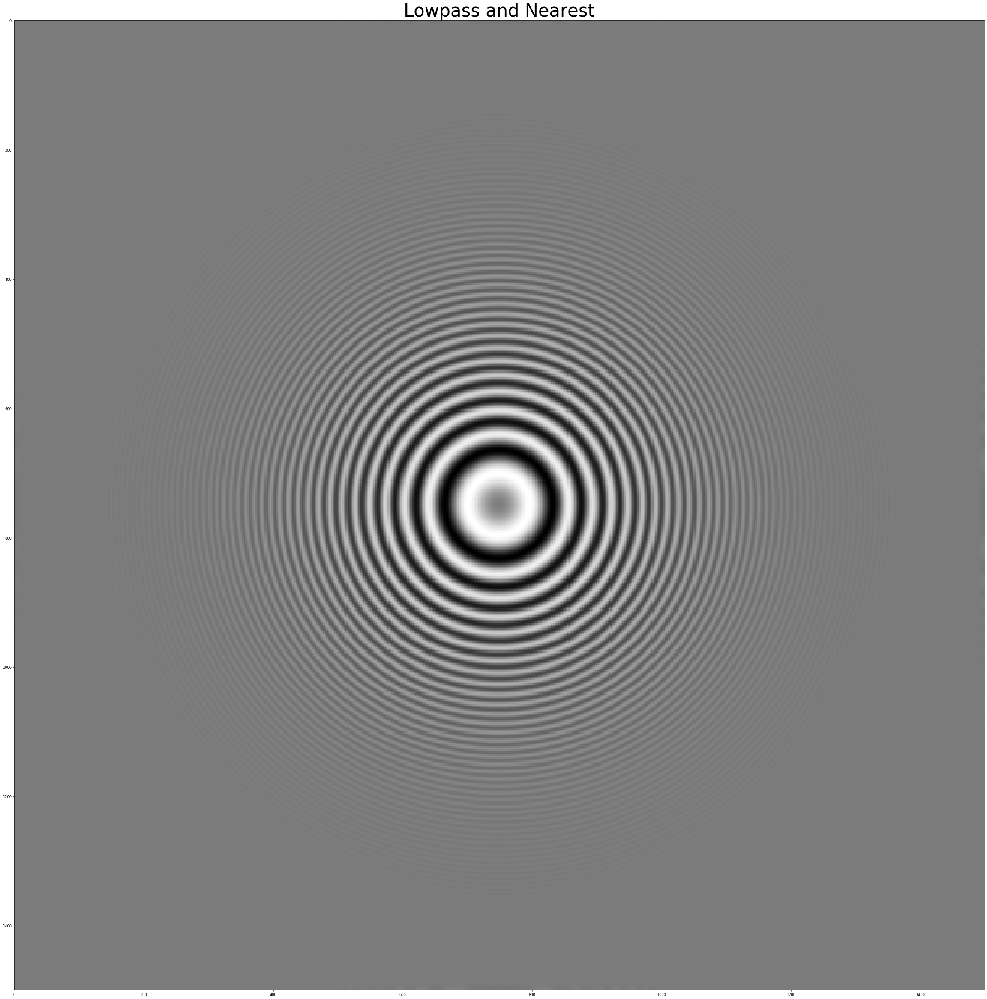

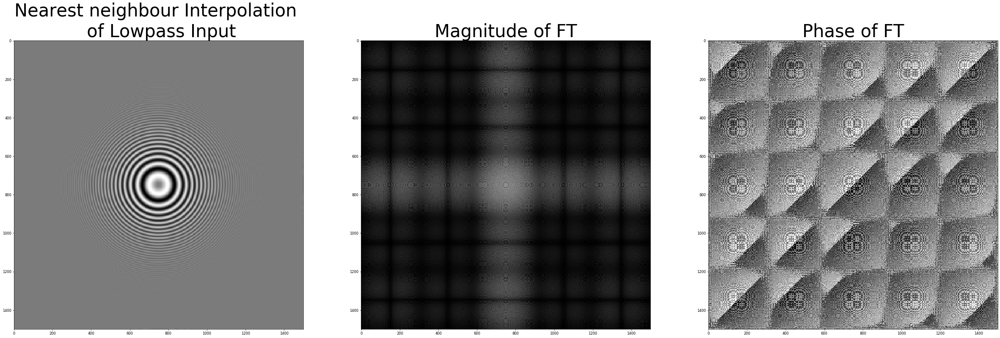

In [181]:
zoneplate_lowp = Image.fromarray(np.real(zone_gauss))
resized_zpl_near = np.array(zoneplate_lowp.resize([int(np.ceil(h*factorx)),int(np.ceil(w*factory))], resample = PIL.Image.NEAREST))
res_fft_near = fftshift(fft2(resized_zpl_near))
fig1 = plt.figure(figsize = [50,50], dpi = 60)
axf1 = fig1.add_subplot(111)
axf1.imshow(np.real(resized_zpl_near), interpolation = None, cmap = cm.gray)
axf1.set_title('Lowpass and Nearest',fontsize = 50)
fig2 = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig2.add_subplot(131)
ax1.imshow(np.real(resized_zpl_near), interpolation =None, cmap = cm.gray)
ax2 = fig2.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(res_fft_near)), cmap = cm.gray)
ax3 = fig2.add_subplot(133)
ax3.imshow(np.angle(res_fft_near), interpolation =None, cmap = cm.gray)
ax1.set_title('Nearest neighbour Interpolation \n of Lowpass Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()

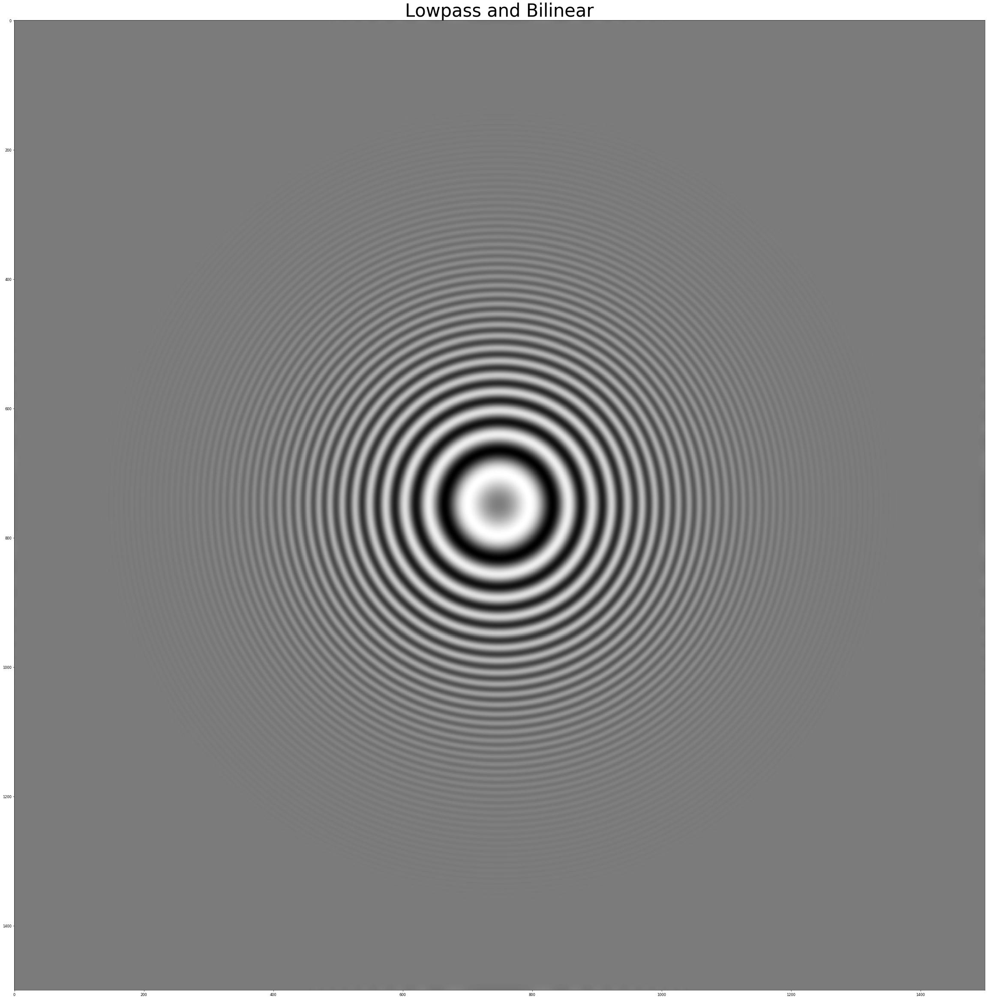

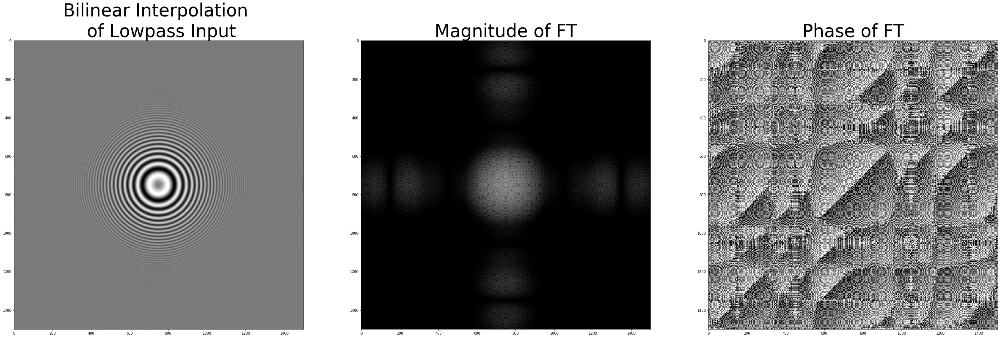

In [182]:
resized_zpl_bil = np.array(zoneplate_lowp.resize([int(np.ceil(h*factorx)),int(np.ceil(w*factory))], resample = PIL.Image.BILINEAR))
res_fft_bil = fftshift(fft2(resized_zpl_bil))
fig1 = plt.figure(figsize = [50,50], dpi = 60)
axf1 = fig1.add_subplot(111)
axf1.set_title('Lowpass and Bilinear',fontsize = 50)
axf1.imshow(np.real(resized_zpl_bil), interpolation = None, cmap = cm.gray)
fig2 = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig2.add_subplot(131)
ax1.imshow(np.real(resized_zpl_bil), interpolation =None, cmap = cm.gray)
ax2 = fig2.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(res_fft_bil)), cmap = cm.gray)
ax3 = fig2.add_subplot(133)
ax3.imshow(np.angle(res_fft_bil), interpolation =None, cmap = cm.gray)
ax1.set_title('Bilinear Interpolation \n of Lowpass Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()

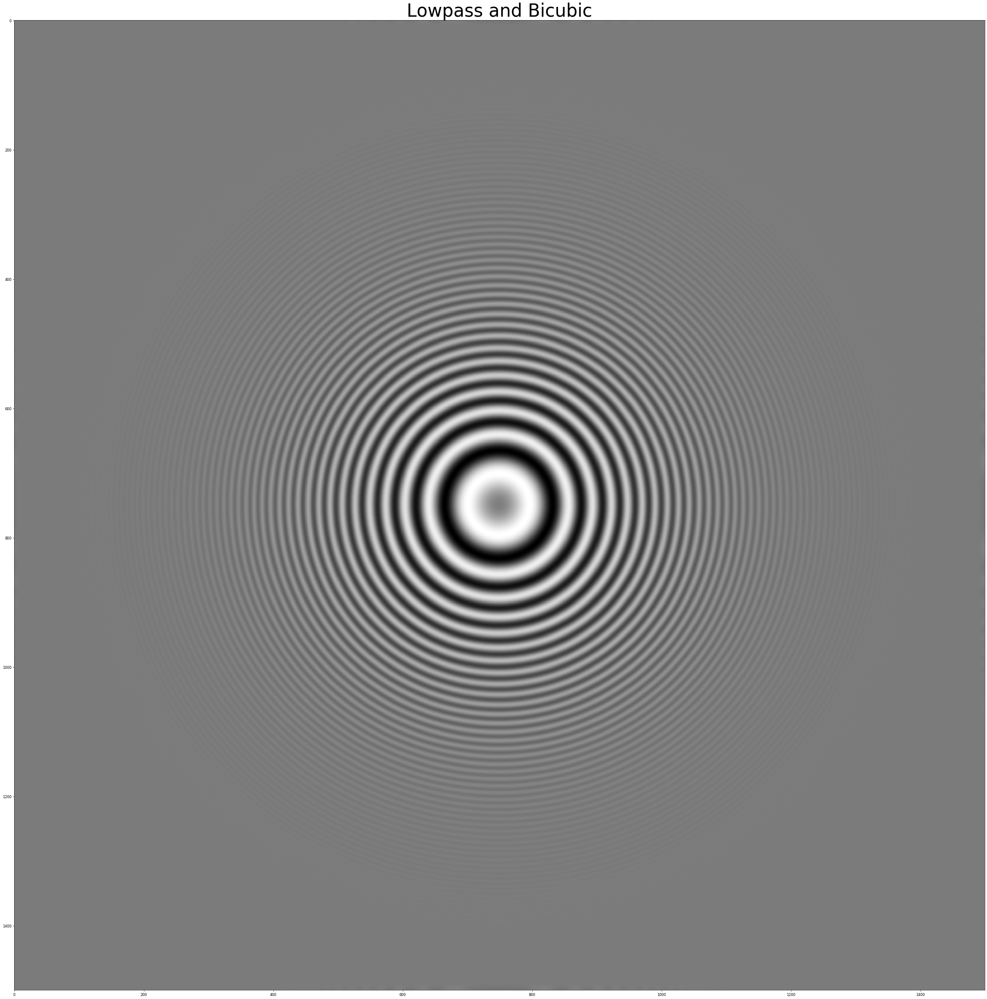

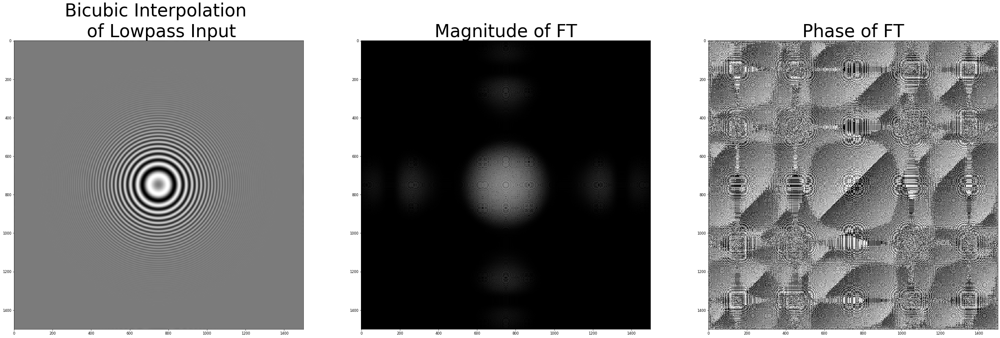

In [183]:
resized_zpl_bic = np.array(zoneplate_lowp.resize([int(np.ceil(h*factorx)),int(np.ceil(w*factory))], resample = PIL.Image.BICUBIC))
res_fft_bic = fftshift(fft2(resized_zpl_bic))
fig1 = plt.figure(figsize = [50,50], dpi = 60)
axf1 = fig1.add_subplot(111)
axf1.imshow(np.real(resized_zpl_bic), interpolation = None, cmap = cm.gray)
axf1.set_title('Lowpass and Bicubic',fontsize = 50)
fig2 = plt.figure(figsize = [50,50], dpi = 60)
ax1 = fig2.add_subplot(131)
ax1.imshow(np.real(resized_zpl_bic), interpolation =None, cmap = cm.gray)
ax2 = fig2.add_subplot(132)
ax2.imshow(20*np.log(1+np.abs(res_fft_bic)), cmap = cm.gray)
ax3 = fig2.add_subplot(133)
ax3.imshow(np.angle(res_fft_bic), interpolation =None, cmap = cm.gray)
ax1.set_title('Bicubic Interpolation \n of Lowpass Input',fontsize = 50)
ax2.set_title('Magnitude of FT',fontsize = 50)
ax3.set_title('Phase of FT',fontsize = 50)
plt.show()